In [1]:
import sys
import numpy as np
from astropy.io import fits
from aspired import aspired
import plotly.io as pio
pio.renderers.default = 'notebook_connected'

/usr/local/lib/python3.7/site-packages/tqdm/autonotebook/__init__.py:18: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


/Users/marcolam/git/ASPIRED/aspired/aspired.py:328: UserWarning:

saxis keyword "SAXIS" is not in the header. saxis is set to 1.

/Users/marcolam/git/ASPIRED/aspired/aspired.py:570: UserWarning:

No dark frames. Dark subtraction is not performed.

/Users/marcolam/git/ASPIRED/aspired/aspired.py:754: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:754: RuntimeWarning:

invalid value encountered in log10



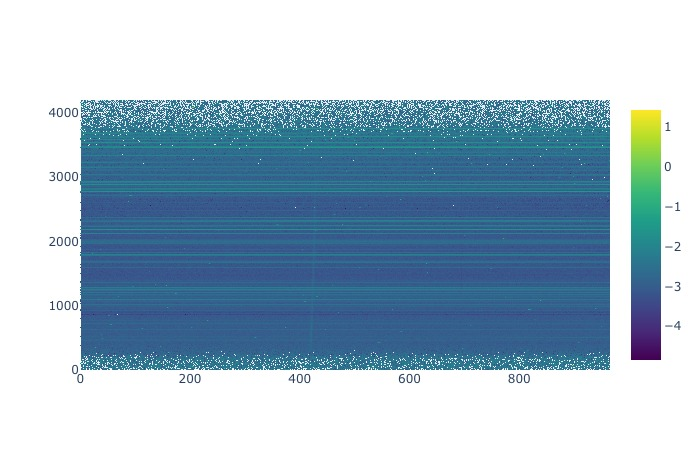

/Users/marcolam/git/ASPIRED/aspired/aspired.py:328: UserWarning:

saxis keyword "SAXIS" is not in the header. saxis is set to 1.

/Users/marcolam/git/ASPIRED/aspired/aspired.py:570: UserWarning:

No dark frames. Dark subtraction is not performed.

/Users/marcolam/git/ASPIRED/aspired/aspired.py:754: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:754: RuntimeWarning:

invalid value encountered in log10



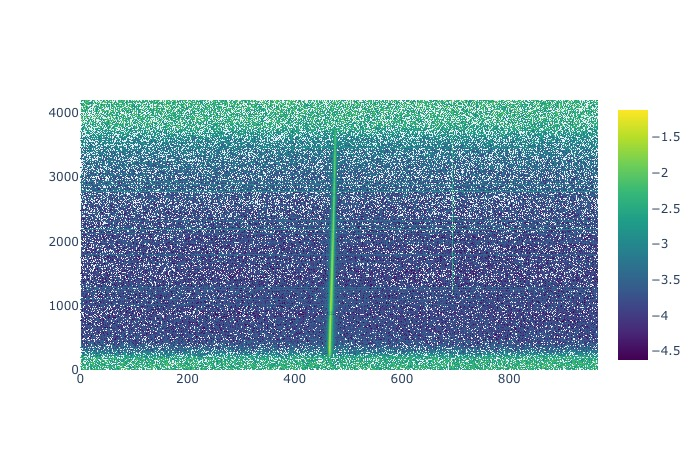

In [2]:
science_frame = aspired.ImageReduction('examples/isis_pso1801p6254.list')
science_frame.reduce()
science_frame.inspect(renderer='jpg')
#science_frame.savefits(overwrite=True)

standard_frame = aspired.ImageReduction('examples/isis_g93m48.list')
standard_frame.reduce()
standard_frame.inspect(renderer='jpg')

In [3]:
# Set the spectral and spatial direction
Saxis = 0

# spec mask
spec_mask = np.arange(100, 4000)
spatial_mask = np.arange(300, 550)

# initialise the two aspired.TwoDSpec()
pso = aspired.TwoDSpec(
    science_frame,
    spatial_mask=spatial_mask,
    spec_mask=spec_mask,
    saxis=Saxis,
    rn=4.5,
    cr=False,
    gain=0.98,
    seeing=1.1,
    silence=True
)
g93 = aspired.TwoDSpec(
    standard_frame,
    spatial_mask=spatial_mask,
    spec_mask=spec_mask,
    saxis=Saxis,
    rn=4.5,
    cr=False,
    gain=0.98,
    seeing=1.1,
    silence=True
)

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1096: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1096: RuntimeWarning:

invalid value encountered in log10



/Users/marcolam/git/SpectRes/spectres/spectral_resampling.py:90: UserWarning:

spectres: Part of the new wavelength range is outside the range of the input data, they are filled with zeros.

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1700: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1700: RuntimeWarning:

invalid value encountered in log10



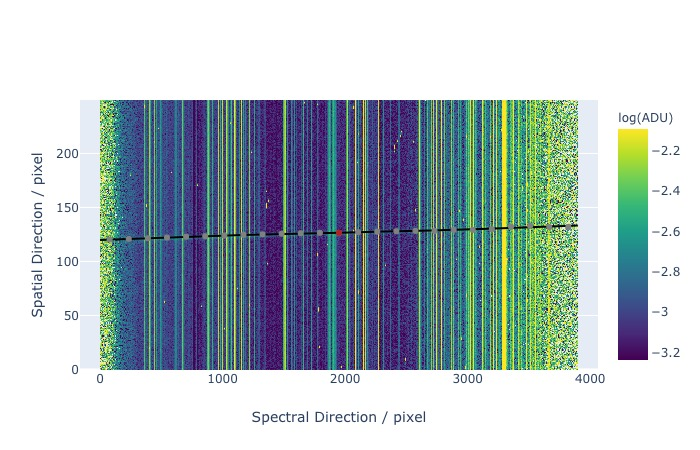

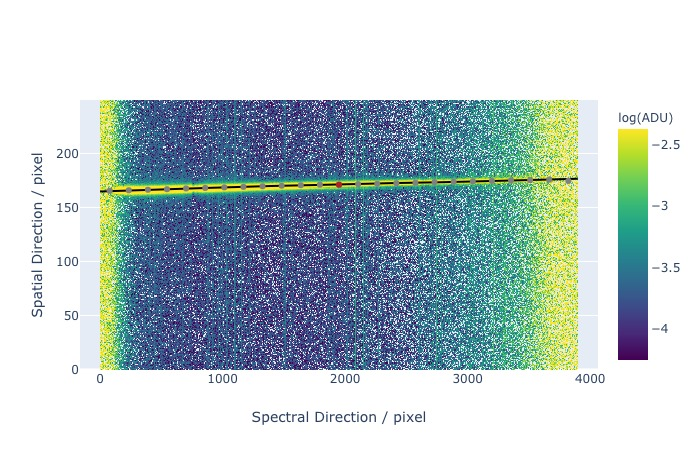

In [4]:
# automatically trace the spectrum
pso.ap_trace(renderer='jpg', display=True)
g93.ap_trace(renderer='jpg', display=True)

In [5]:
# Optimal extracting spectrum by summing over the aperture along the trace
pso.ap_extract(
    apwidth=15,
    optimal=True,
    display=True)
g93.ap_extract(
    apwidth=20, skysep=3, skywidth=5, skydeg=1,
    optimal=True,
    display=True)

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1415: RuntimeWarning:

invalid value encountered in double_scalars

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1402: RuntimeWarning:

divide by zero encountered in true_divide

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1963: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1963: RuntimeWarning:

invalid value encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:2092: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:2100: RuntimeWarning:

invalid value encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:2103: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:2104: RuntimeWarning:

invalid value encountered in log10



/Users/marcolam/git/ASPIRED/aspired/aspired.py:1963: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:1963: RuntimeWarning:

invalid value encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:2100: RuntimeWarning:

invalid value encountered in log10

/Users/marcolam/git/ASPIRED/aspired/aspired.py:2104: RuntimeWarning:

invalid value encountered in log10



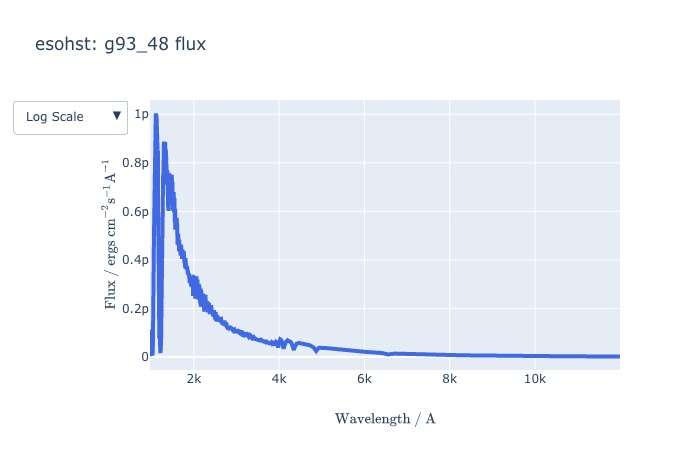

In [6]:
fluxcal = aspired.StandardFlux(
    target='g93_48',
    group='esohst',
    cutoff=0.4,
    ftype='flux'
)
fluxcal.load_standard()
fluxcal.inspect_standard(renderer='jpg')

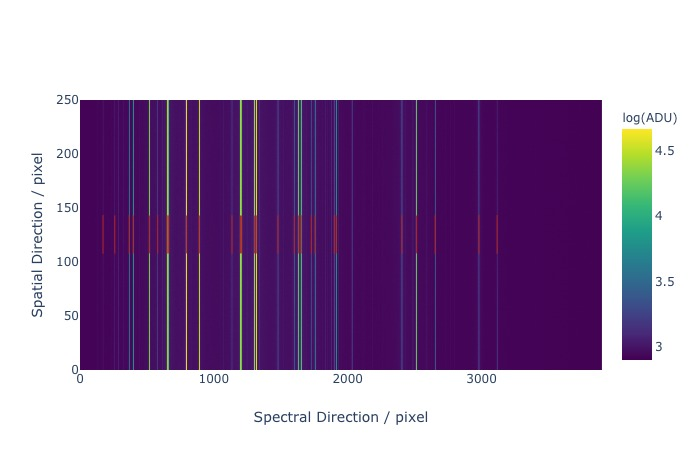

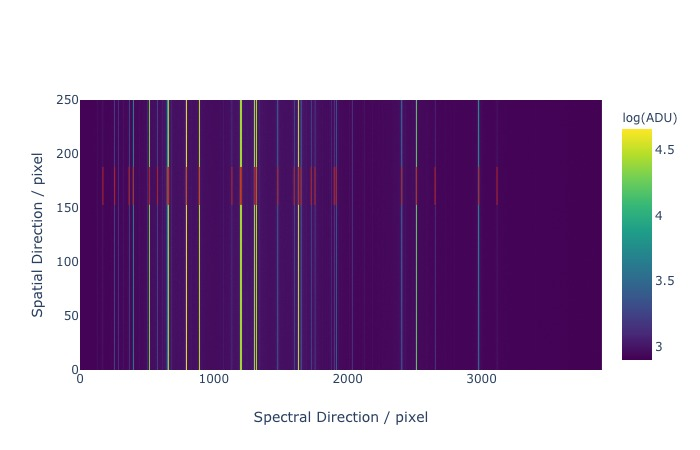

In [7]:
# Placeholder of wavelength calibration
wavecal_science = aspired.WavelengthPolyFit(pso, science_frame)
wavecal_standard = aspired.WavelengthPolyFit(g93, standard_frame)

wavecal_science.find_arc_lines(display=True, renderer='jpg', percentile=20.)
wavecal_standard.find_arc_lines(display=True, renderer='jpg', percentile=20.)

In [8]:
wavecal_science.fit(
    elements=["CuNeAr_low"],
    sample_size=5,
    min_wave=7000.,
    max_wave=10500.,
    range_tolerance=500,
    ransac_thresh=1,
    polydeg=5,
    display=True)
wavecal_standard.fit(
    elements=["CuNeAr_low"],
    sample_size=5,
    min_wave=7000.,
    max_wave=10500.,
    range_tolerance=500,
    ransac_thresh=1,
    polydeg=5,
    display=True)

/Users/marcolam/git/SpectRes/spectres/spectral_resampling.py:90: UserWarning:

spectres: Part of the new wavelength range is outside the range of the input data, they are filled with zeros.



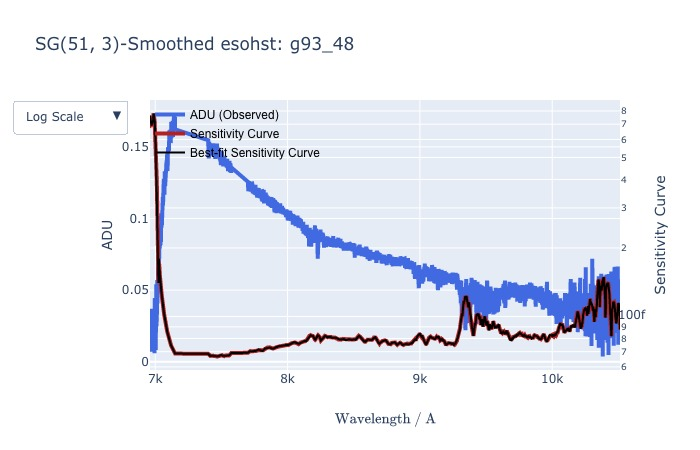

In [9]:
# Get the sensitivity curves
pso_reduced = aspired.OneDSpec(
    pso,
    wavecal_science,
    standard=g93,
    wave_cal_std=wavecal_standard,
    flux_cal=fluxcal
)
pso_reduced.apply_wavelength_calibration('all')
pso_reduced.compute_sencurve(kind='cubic', smooth=True, slength=51)
pso_reduced.inspect_sencurve(renderer='jpg')

In [10]:
pso_reduced.apply_flux_calibration('all')
pso_reduced.inspect_reduced_spectrum('all', wave_min=7000, wave_max=10500, renderer='default')